In [ ]:
import torch
import torchvision
import torchvision.transforms as T
import torchvision.models as models
import numpy as np
import matplotlib.pyplot as plt
import requests
import os
from PIL import Image

def norm(x) :
  transform = T.Compose([
    T.Resize((224,224)),
    T.Normalize(mean=[0.485, 0.456, 0.406], std=[0.229, 0.224, 0.225])
  ])

  return transform(x)

def deNorm(x) :
  transform = T.Compose([
    T.Normalize(mean=[0, 0, 0], std=[4.3668, 4.4643, 4.4444]),
    T.Normalize(mean=[-0.485, -0.456, -0.406], std=[1, 1, 1]),
  ])

  return transform(x)

def preprocessTensor(x) :
  x = T.ToTensor()(x)
  x = norm(x)
  x = x.unsqueeze(dim=0)

  return x

def deprocessTensor(imageTensor) :
  imageTensor = T.Lambda(lambda x: x[0])(imageTensor)
  imageTensor = deNorm(imageTensor)
  imageTensor = T.ToPILImage()(imageTensor)

  return imageTensor

def downloadImageTensors(imageUrls) :
  images = []
  for url in imageUrls :
    path, name = os.path.split(url)
    response = requests.get(url)
    with open(name, 'wb') as f :
      f.write(response.content)

    img = Image.open(name)
    img = preprocessTensor(img)
    images.append(img)
    
  return images

In [ ]:
# Load the model ad categories
!wget https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt
with open("imagenet_classes.txt", "r") as f :
  categories = [s.strip() for s in f.readlines()]

model =  models.regnet_x_800mf(pretrained=True)

--2022-05-10 03:47:35--  https://raw.githubusercontent.com/pytorch/hub/master/imagenet_classes.txt
Resolving raw.githubusercontent.com (raw.githubusercontent.com)... 185.199.108.133, 185.199.109.133, 185.199.110.133, ...
Connecting to raw.githubusercontent.com (raw.githubusercontent.com)|185.199.108.133|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: 10472 (10K) [text/plain]
Saving to: ‘imagenet_classes.txt’

imagenet_classes.tx 100%[===================>]  10.23K  --.-KB/s    in 0s      

2022-05-10 03:47:36 (81.4 MB/s) - ‘imagenet_classes.txt’ saved [10472/10472]



Downloading: "https://download.pytorch.org/models/regnet_x_800mf-ad17e45c.pth" to /root/.cache/torch/hub/checkpoints/regnet_x_800mf-ad17e45c.pth


  0%|          | 0.00/27.9M [00:00<?, ?B/s]

In [ ]:
#download the images and give them a display name
imageUrls = ["https://i.redd.it/nl08jmilxad61.jpg",
             "https://www.pablopicasso.org/images/paintings/the-dream.jpg",
             "https://i0.wp.com/ultrawolvesunderthefullmoon.blog/wp-content/uploads/2015/03/Paul-Klee-22Bl%C3%BChendes-Flowering22-1934-copy.jpg?ssl=1",
             "https://www.wassily-kandinsky.org/images/gallery/Several-Circles.jpg",
             "https://www.renemagritte.org/images/paintings/the-mysteries-of-the-horizon.jpg",
             "https://www.renemagritte.org/images/paintings/son-of-man.jpg",
             "https://www.renemagritte.org/images/paintings/seducer.jpg",
             "https://images.pexels.com/photos/105810/pexels-photo-105810.jpeg?cs=srgb&dl=pexels-mark-broadhurst-105810.jpg&fm=jpg",
             "https://uploads7.wikiart.org/images/salvador-dali/portdogue-1919.jpg",
             "https://uploads0.wikiart.org/images/albrecht-durer/the-stork-1515.jpg!Large.jpg"]

imageNames = ["Evenening Tones\n- Oscar Bluemner", "The Dream\n- Pablo Picasso",
              "Flowering\n- Paul Klee", "Serveral Circles", "The Mysteries\nof the Horizon", 
              "Son of Man","Seducer", "Owl", "Portdogue", "The Stork"]

images = downloadImageTensors(imageUrls)

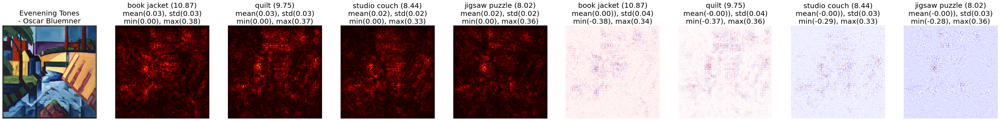

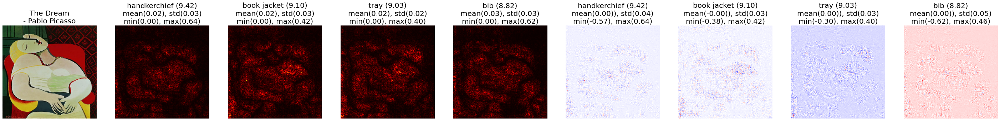

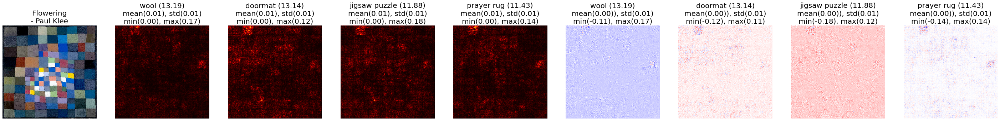

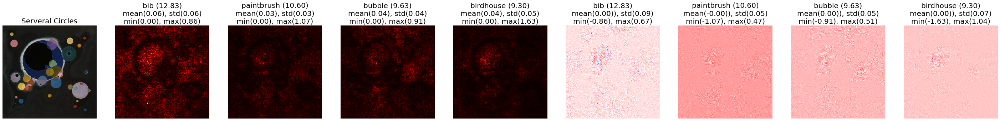

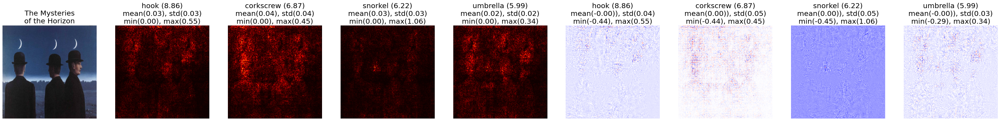

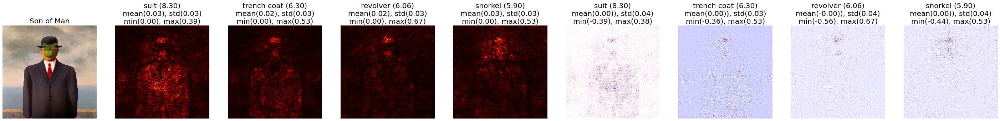

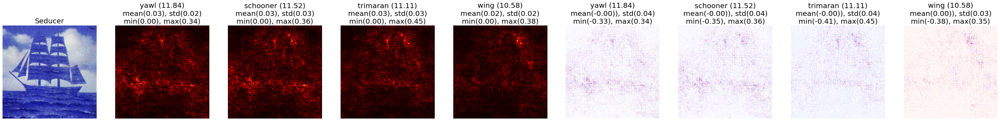

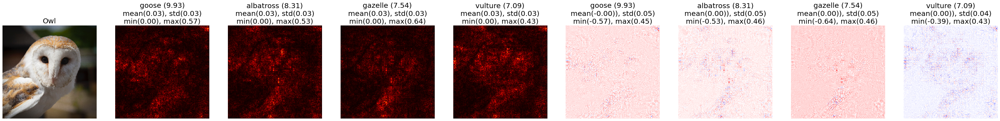

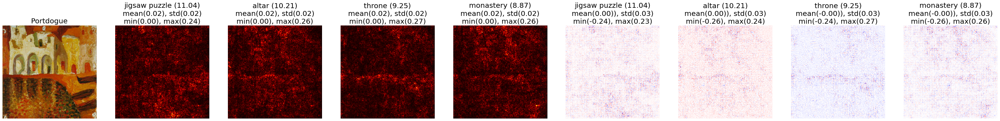

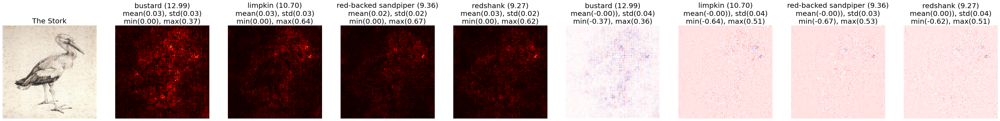

In [13]:
#define a saliency function
def viewSaliency(model, imageTensor, k=2, name="") :
  model.eval()

  fig = plt.figure(figsize=(50,40))

  ax = fig.add_subplot(1,2*k+1,1)
  plt.imshow(deprocessTensor(imageTensor))
  ax.axis('off')
  ax.set_title(name, size=20)

  for i in range(k) :
    x = imageTensor.clone().detach()
    x.requires_grad_()

    out = model(x)
    top = out.topk(k, largest=True)
         
    score = top[0][0][i]
    category = top[1][0][i]

    score.backward()

    s = torch.squeeze(x.grad.data)
    indices = torch.argmax(torch.abs(s), dim=0, keepdim=True)

    saliency = torch.gather(s, 0, indices).squeeze()
    absSaliency = torch.abs(saliency)
    
    min = torch.min(saliency)
    max = torch.max(saliency)

    absMin = torch.min(absSaliency)
    absMax = torch.max(absSaliency)

    ax = fig.add_subplot(1,2*k+1,i+2)
    plt.imshow(absSaliency, cmap=plt.cm.hot, vmin=absMin, vmax=absMax)
    ax.axis('off')
    ax.set_title(f"{categories[category]} ({score :.2f})\nmean({torch.mean(absSaliency):.2f}), std({torch.std(absSaliency):.2f})\nmin({absMin:.2f}), max({absMax:.2f})", size=20)

    ax = fig.add_subplot(1,2*k+1,k+i+2)
    plt.imshow(saliency, cmap=plt.cm.bwr, vmin=min, vmax=max)
    ax.axis('off')
    ax.set_title(f"{categories[category]} ({score :.2f})\nmean({torch.mean(saliency):.2f})), std({torch.std(saliency):.2f})\nmin({min:.2f}), max({max:.2f})", size=20)

  plt.show()
  print()





#show the saliency for each of the images
for i in range(len(images)) :
  viewSaliency(model, images[i], k=4, name=imageNames[i])


On the left are the individual artworks labeled with the name of the paiting. Displayed are the two best guesses and worst guesses, and the corresponding magnitudes vanilla gradients. The last four images in the row are the same gradients 